# Graphical representation of complex networks

In [1]:
from libpysal import weights
import matplotlib.pyplot as plt
import networkx as nx
import geopandas
import numpy as np
import pandas as pd
import pickle

g_files=['carnival_tourist','no_carnival_tourist','carnival_residents','no_carnival_residents']
filepath = "graph_venecia.geojson"
european_regions = geopandas.read_file(filepath)

form_dict = {
    'R6 Connector hubs': (5,1,0),
    'R4 Non-hub kinless': (5,0,0),
    'R7 Kinless hubs': (6,1,0),
    'R3 Non-hub connectors': (4,0,0),
    'R5 Provincial hubs': (4,1,0),
    'R2 Peripheral': (3,0,0),
    'R1 Ultra-peripheral': "o"}

color_dict = {
    0: '#1f77b4',
    1: '#ff7f0e',
    2: '#2ca02c',
    3: '#d62728',
    4: '#9467bd',
    5: '#8c564b',
    6: '#e377c2',
    7: '#17becf',
    8: '#bcbd22',
    9: '#7f7f7f'}

In [2]:
set(european_regions['type'].to_list())
european_regions.groupby(['type']).count()


,osm_id,osm_way_id,name,aeroway,amenity,admin_level,barrier,boundary,building,craft,...,man_made,military,natural,office,place,shop,sport,tourism,other_tags,geometry
type,,,,,,,,,,,,,,,,,,,,,
Altana Suite,0,5,5,0,0,0,0,0,5,0,...,0,0,0,0,0,0,0,0,5,5
Crocky's House,0,8,0,0,0,0,0,0,8,0,...,0,0,0,0,0,0,0,0,8,8
Family tent,0,10,0,0,0,0,0,0,10,0,...,0,0,0,0,0,0,0,0,10,10
Fantasy Suite,0,30,0,0,0,0,0,0,30,0,...,0,0,0,0,0,0,0,0,30,30
Flower Suite,0,14,0,0,0,0,0,0,14,0,...,0,0,0,0,0,0,0,0,14,14
Golden Suite,0,119,52,0,0,0,0,0,119,0,...,0,0,0,0,0,0,0,0,67,119
Golden Suite Laguna,0,8,8,0,0,0,0,0,8,0,...,0,0,0,0,0,0,0,0,8,8
Golden Suite Pool,0,20,0,0,0,0,0,0,20,0,...,0,0,0,0,0,0,0,0,20,20
Lodge Tent,0,14,0,0,0,0,0,0,14,0,...,0,0,0,0,0,0,0,0,14,14


## Graphical representation of the network on the complete map of Venice

Network:  carnival_tourist


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/3453689909.py:68: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Network:  no_carnival_tourist


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/3453689909.py:68: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Network:  carnival_residents


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/3453689909.py:68: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Network:  no_carnival_residents


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/3453689909.py:68: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


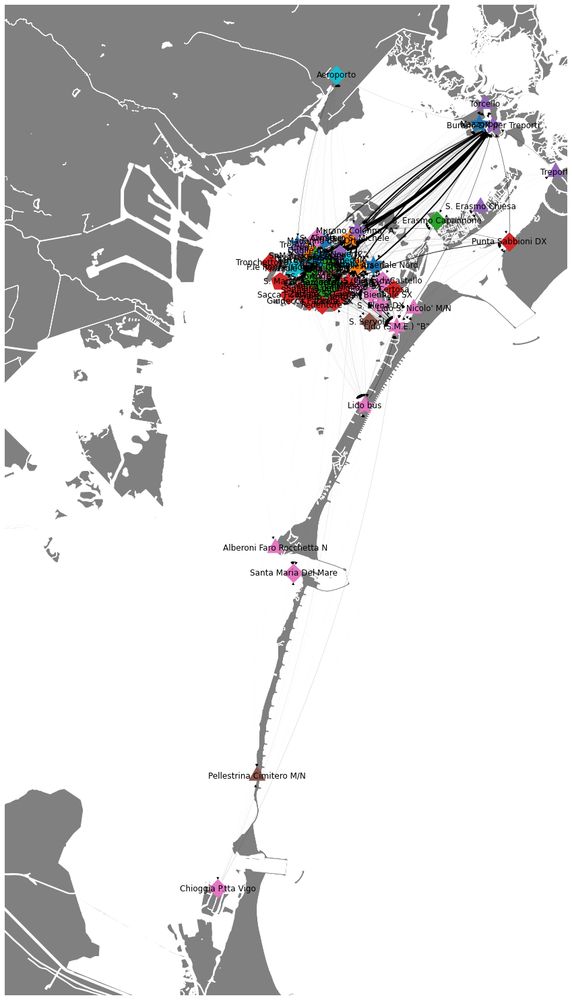

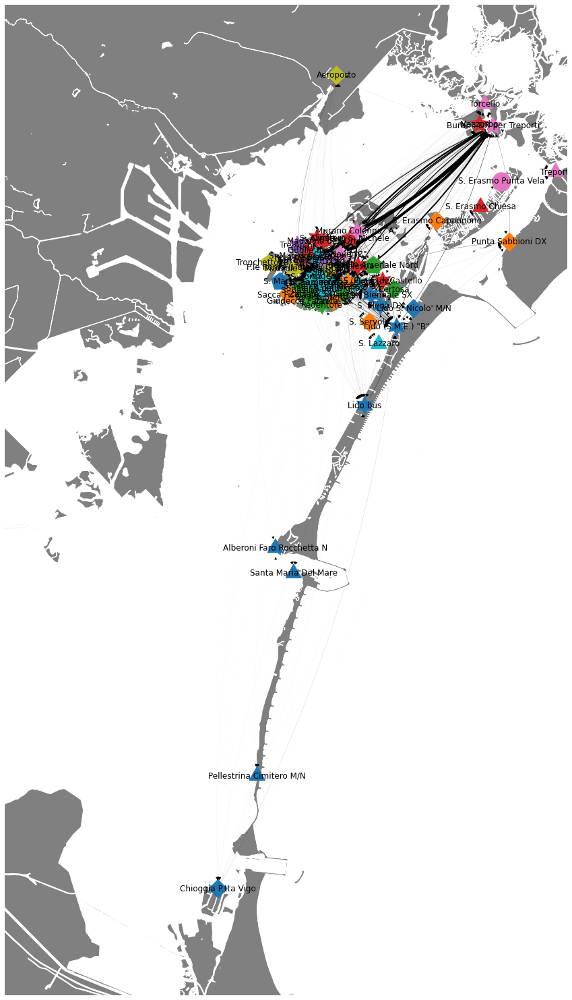

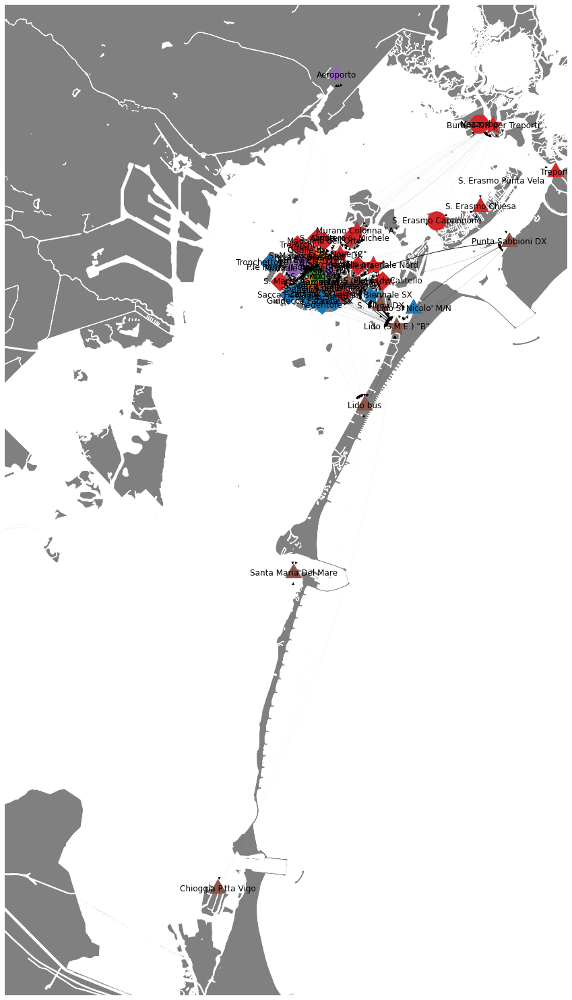

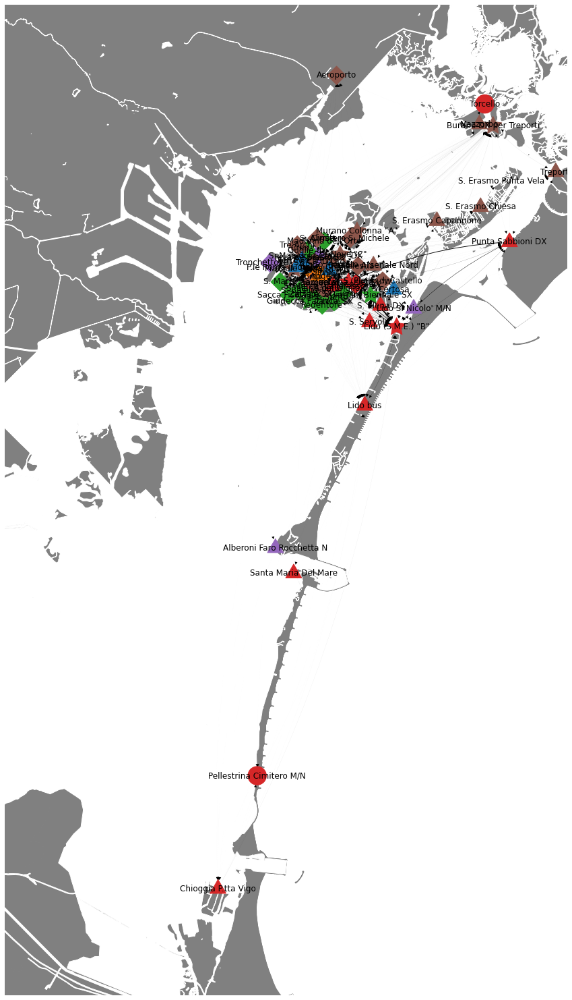

In [4]:
#european_regions=european_regions[european_regions['type']=='multipolygon']
water=european_regions[european_regions['natural']=='water']
#european_regions=european_regions[european_regions['building'].notnull()]
water=water.cx[12.1756: 12.4530,  45.1869:45.5294]
european_regions=european_regions.cx[12.1756: 12.4530,  45.1869:45.5294]



def plot_map(G,g_file):
    dfloc=pd.read_csv('locations.csv')
    lNode=dfloc['DESCRIZIONE'].to_list()
    lLon=dfloc['lon'].to_list()
    lLat=dfloc['lat'].to_list()
    dLoc=dict()
    for i in range(len(lNode)):
        dLoc[lNode[i]]=[lLon[i],lLat[i]]
    
    
    
    
    remove = [node for node, degree in dict(G.degree()).items() if degree <= 1]
    #remove.append('S. Erasmo Punta Vela')
    G.remove_nodes_from(remove)
    for k in G.nodes:
        try:
            G.remove_edge(k, k)
        except:
            pass
    with open(g_file+'_comunity.pickle', 'rb') as handle:
        comunity = pickle.load(handle)
    dComunity=dict()
    for c,k in enumerate(comunity):
        for j in k:
            dComunity[j]=c;
    with open(g_file+'_rol.pickle', 'rb') as handle:
        rol = pickle.load(handle)
    df=nx.to_pandas_edgelist(G)
    df['comunity']=df['source'].map(dComunity)
        
    dfn=pd.DataFrame({'node':list(G.nodes())})
    dfn['rol']=dfn['node'].map(rol)
    dfn['lat']=dfn['node'].map(lambda x: dLoc[x][0])
    dfn['lon']=dfn['node'].map(lambda x: dLoc[x][1])
    #df.to_csv(i+'_edges.csv', index=False)
    #dfn.to_csv(i+'_nodes.csv', index=False)
        
        
    
    
    max_weight = max(d['weight'] for u, v, d in G.edges(data=True))
    
    fig, ax = plt.subplots(1, 1, figsize=(35,27))
    
    ax = european_regions.plot(linewidth=1, edgecolor="grey", facecolor="grey", ax=ax)
    ax = water.plot(linewidth=1, edgecolor="white", facecolor="white", ax=ax)
    ax.axis([12.1756, 12.4530, 45.1869,45.5294])
    ax.axis("off")
    #nx.draw(G, dLoc, ax=ax, node_size=5, node_color="r")
    nx.draw_networkx_edges(G,pos=dLoc, width=([(d['weight']/max_weight)*5 for u, v, d in G.edges(data=True)]), ax=ax,connectionstyle="arc3,rad=0.1",node_size=700)  
    nx.draw_networkx_labels(G,pos=dLoc, font_size=12)
    for i in form_dict:
        l=list()
        for j in rol:
            if rol[j]==i:
                l.append(j)
        g=G.subgraph(l)
        nx.draw_networkx_nodes(g,pos=dLoc, node_color=[color_dict[dComunity[node]] for node in g.nodes()], ax=ax,node_size=750, node_shape=form_dict[i])
    fig.show()
for i in g_files:
    G=nx.read_graphml('/Users/hector/Codigos/python/PyCharmProjects/scientificProject/'+i+'.graphml')
    print("Network: ",i)
    plot_map(G,i)


## Graphical representation of the network centred on the island of Venice

Network:  carnival_tourist


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/2433507959.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Network:  no_carnival_tourist


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/2433507959.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Network:  carnival_residents


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/2433507959.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Network:  no_carnival_residents


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/2433507959.py:64: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


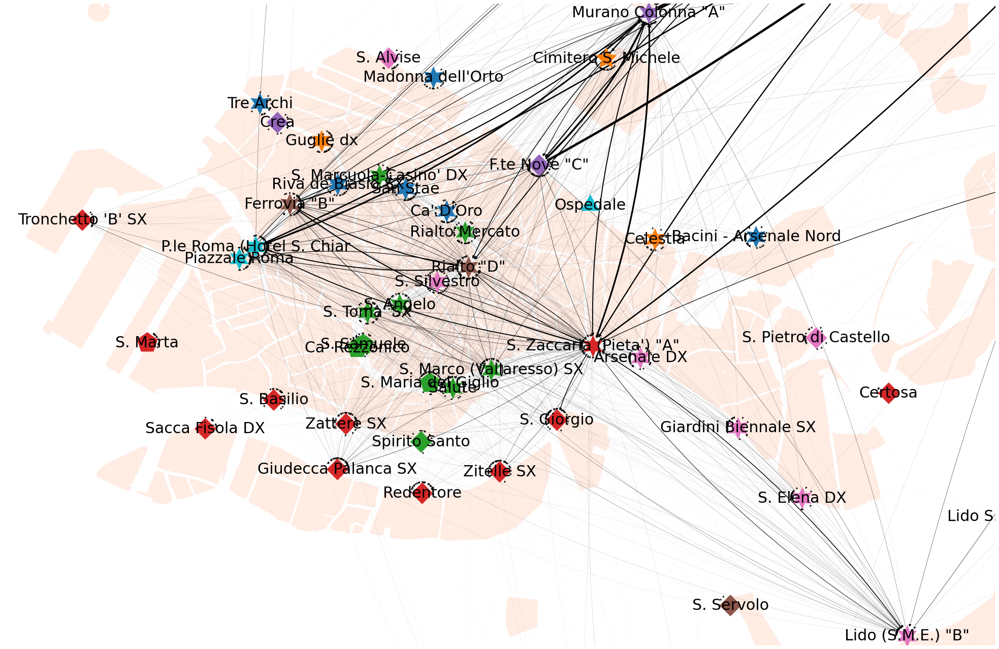

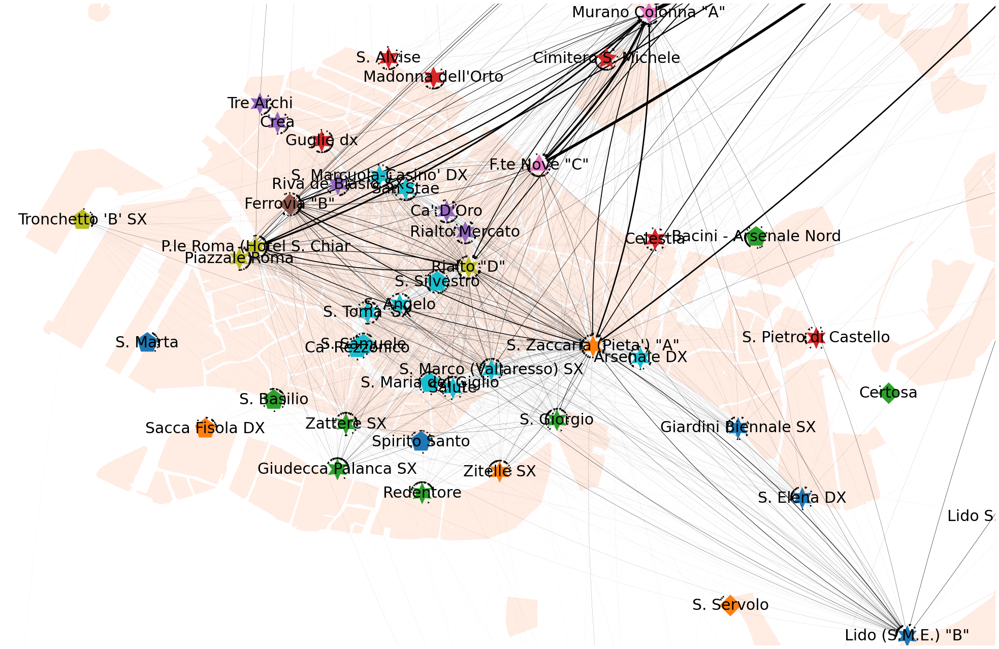

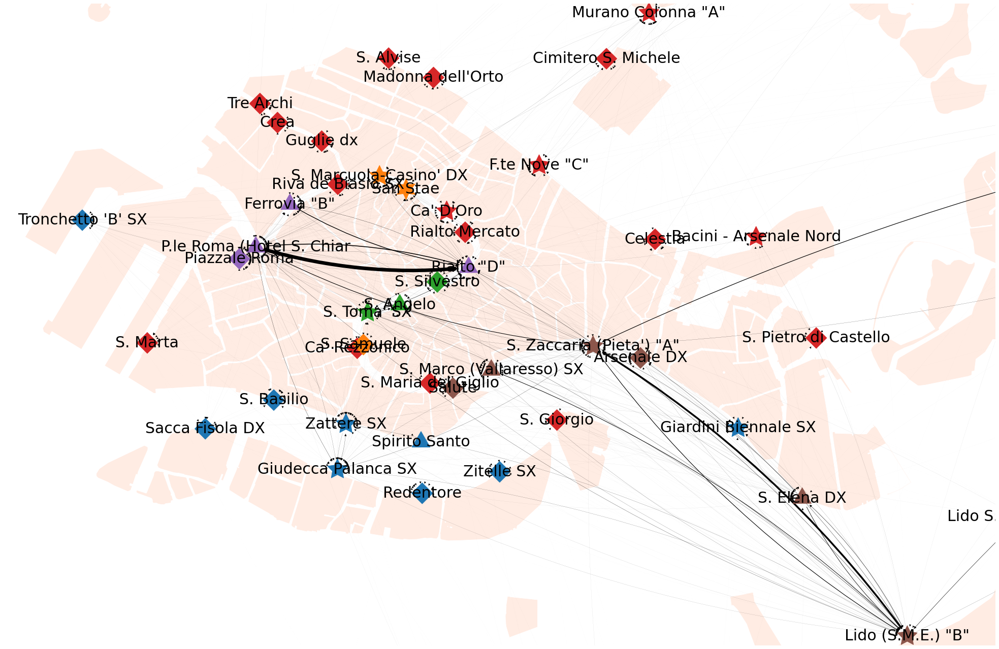

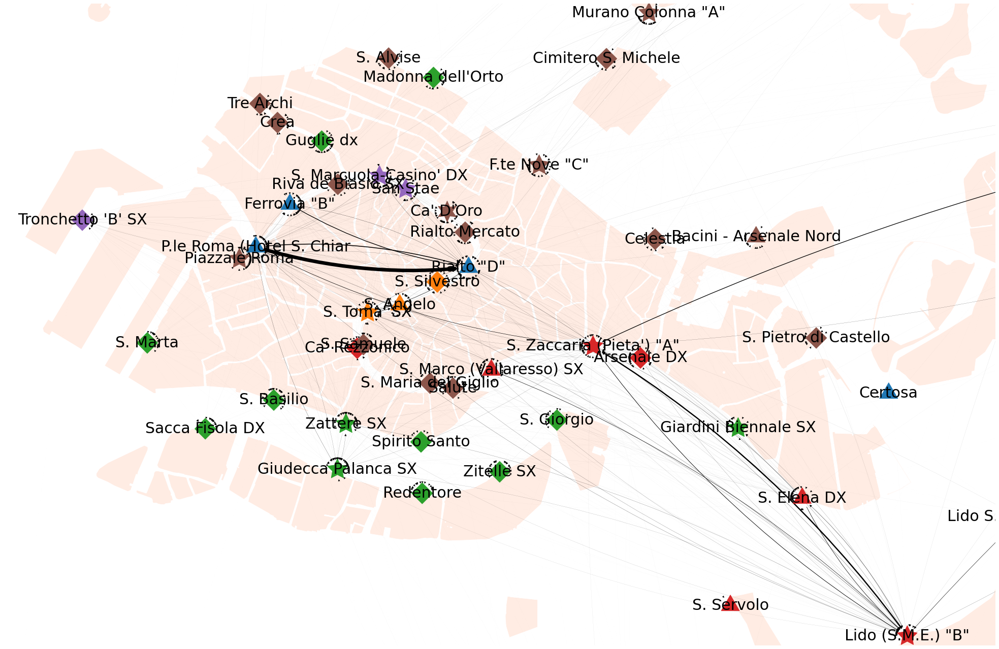

In [5]:
#european_regions=european_regions[european_regions['type']=='multipolygon']
water=european_regions[european_regions['natural']=='water']
#european_regions=european_regions[european_regions['building'].notnull()]
water=water.cx[12.1756: 12.4530,  45.1869:45.5294]
european_regions=european_regions.cx[12.1756: 12.4530,  45.1869:45.5294]



def plot_sub_map(G,g_file):
    dfloc=pd.read_csv('locations.csv')
    lNode=dfloc['DESCRIZIONE'].to_list()
    lLon=dfloc['lon'].to_list()
    lLat=dfloc['lat'].to_list()
    dLoc=dict()
    for i in range(len(lNode)):
        dLoc[lNode[i]]=[lLon[i],lLat[i]]
    
    
    
    remove = [node for node, degree in dict(G.degree()).items() if degree <= 1]
    remove.append('S. Erasmo Punta Vela')
    G.remove_nodes_from(remove)
    for k in G.nodes:
        try:
            G.remove_edge(k, k)
        except:
            pass
    with open(g_file+'_comunity.pickle', 'rb') as handle:
        comunity = pickle.load(handle)
    dComunity=dict()
    for c,k in enumerate(comunity):
        for j in k:
            dComunity[j]=c;
    with open(g_file+'_rol.pickle', 'rb') as handle:
        rol = pickle.load(handle)
    df=nx.to_pandas_edgelist(G)
    df['comunity']=df['source'].map(dComunity)
        
    dfn=pd.DataFrame({'node':list(G.nodes())})
    dfn['rol']=dfn['node'].map(rol)
    dfn['lat']=dfn['node'].map(lambda x: dLoc[x][0])
    dfn['lon']=dfn['node'].map(lambda x: dLoc[x][1])
    
        
    
    max_weight = max(d['weight'] for u, v, d in G.edges(data=True))
    
    fig, ax = plt.subplots(1, 1, figsize=(35,27))
    
    ax = european_regions.plot(linewidth=1, edgecolor="#ffece3", facecolor="#ffece3", ax=ax)
    ax = water.plot(linewidth=1, edgecolor="white", facecolor="white", ax=ax)
    ax.axis([12.3004, 12.3754, 45.4175,45.4516])
    ax.axis("off")
    #nx.draw(G, dLoc, ax=ax, node_size=5, node_color="r")
    nx.draw_networkx_edges(G,pos=dLoc, width=([(d['weight']/max_weight)*7 for u, v, d in G.edges(data=True)]), ax=ax,connectionstyle="arc3,rad=0.1",node_size=1500)
    nx.draw_networkx_labels(G,pos=dLoc, font_size=30)
    for i in form_dict:
        l=list()
        for j in rol:
            if rol[j]==i:
                l.append(j)
        g=G.subgraph(l)
        nx.draw_networkx_nodes(g,pos=dLoc, node_color=[color_dict[dComunity[node]] for node in g.nodes()], ax=ax,node_size=1700, node_shape=form_dict[i])
    fig.show()
    
for i in g_files:
    G=nx.read_graphml('/Users/hector/Codigos/python/PyCharmProjects/scientificProject/'+i+'.graphml')
    print("Network: ",i)
    plot_sub_map(G,i)  

## Representation of complex networks using Kamada Kawai layout

Network:  carnival_tourist


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/387521494.py:55: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Network:  no_carnival_tourist


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/387521494.py:55: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Network:  carnival_residents


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/387521494.py:55: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


Network:  no_carnival_residents


/var/folders/s3/f6v153x93s33zjf0wl3p1bf00000gn/T/ipykernel_57087/387521494.py:55: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


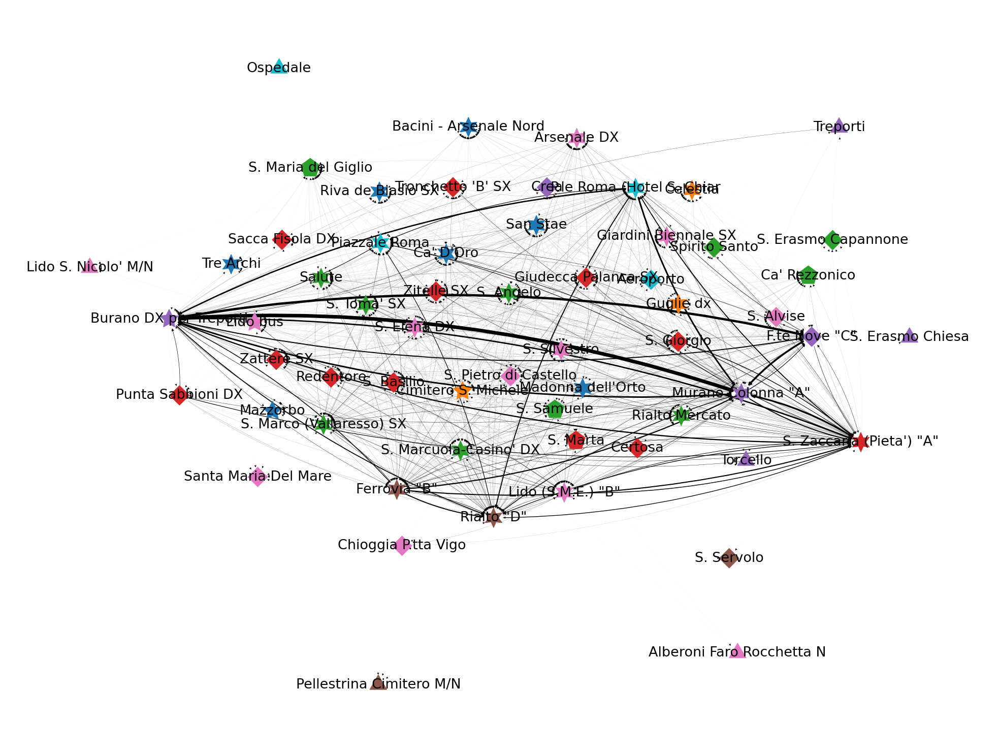

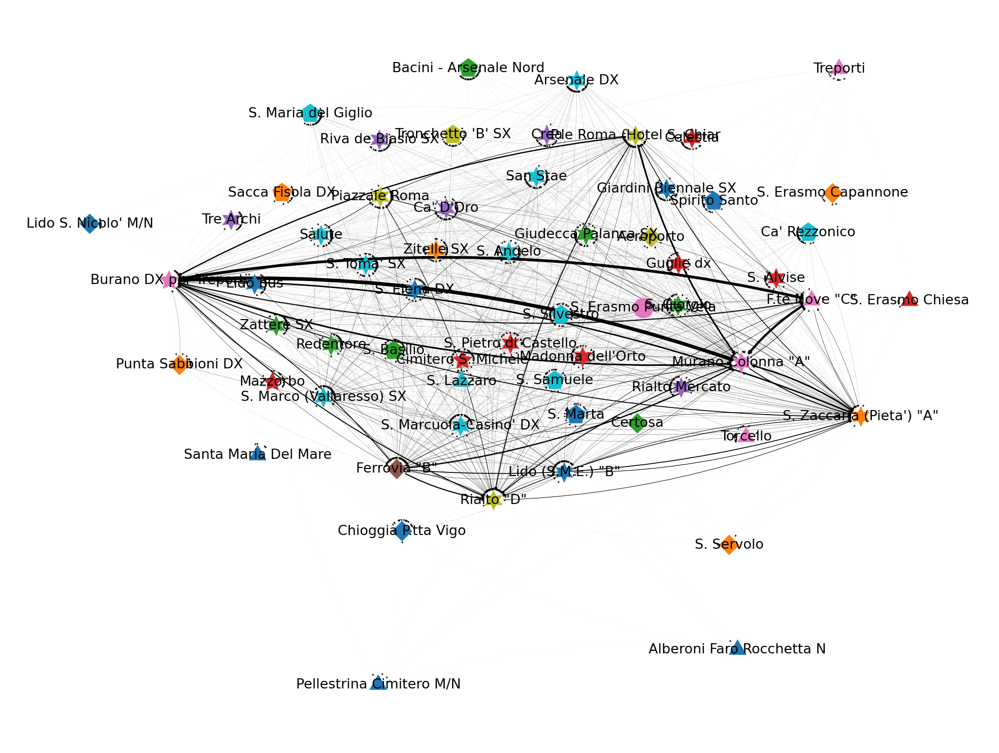

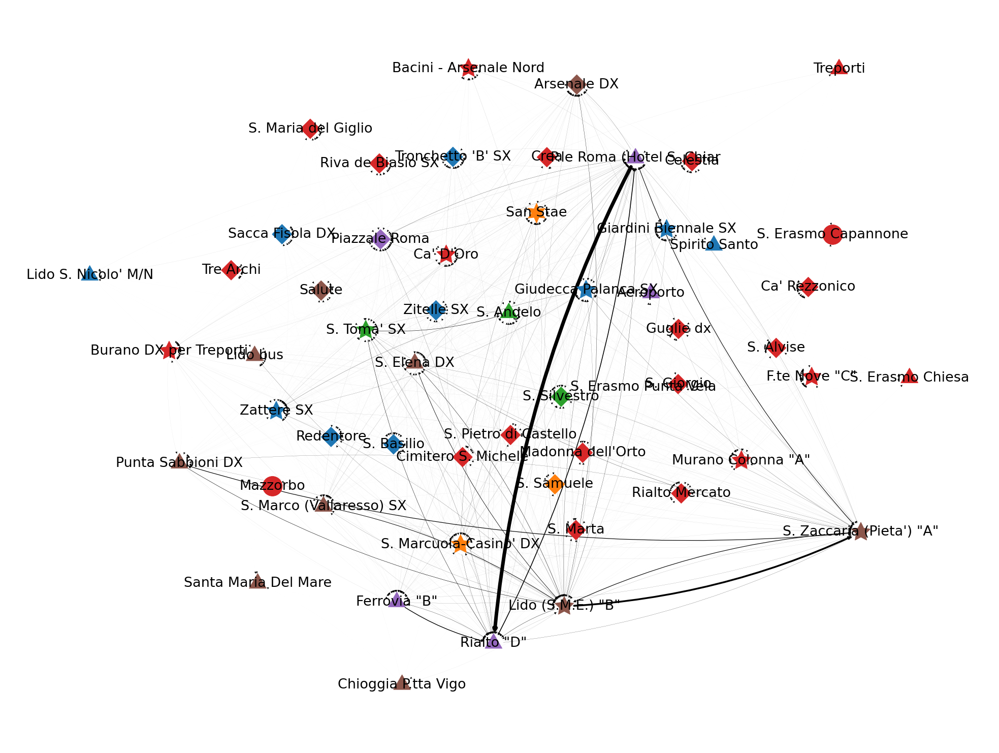

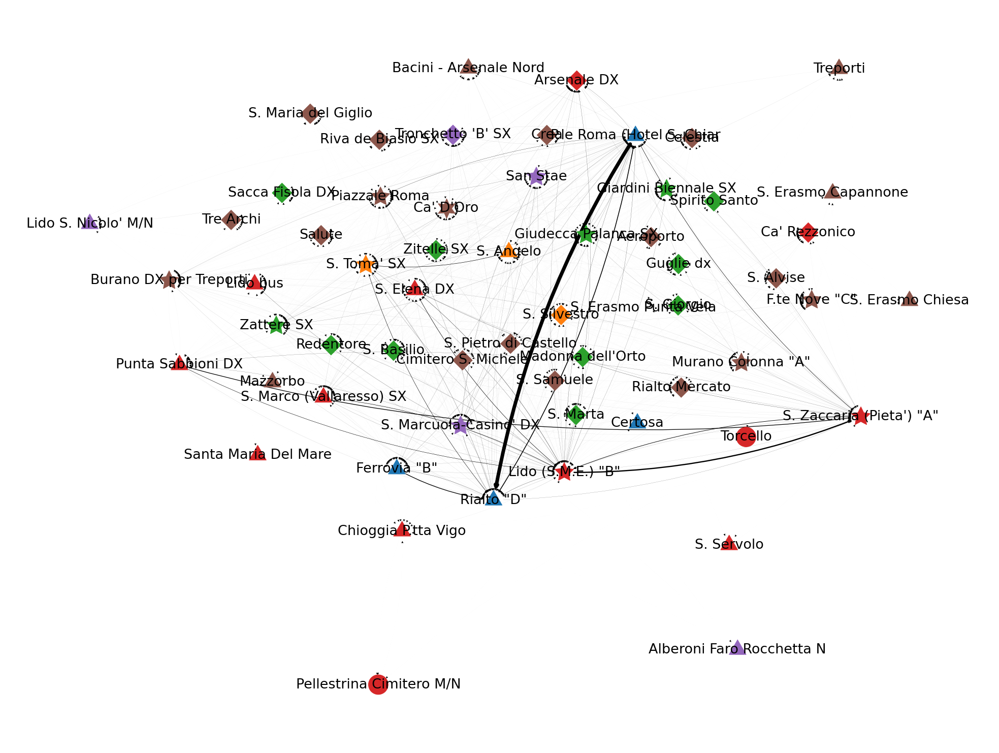

In [7]:




#for the positions of the nodes
X=nx.read_graphml('/Users/hector/Codigos/python/PyCharmProjects/scientificProject/'+'carnival_tourist'+'.graphml')
#It is the only node missing from this network.
X.add_node('S. Erasmo Punta Vela')

dLoc=nx.kamada_kawai_layout(X)


def plot_graph(G,g_file):
    remove = [node for node, degree in dict(G.degree()).items() if degree <= 1]
    
    G.remove_nodes_from(remove)
    for k in G.nodes:
        try:
            G.remove_edge(k, k)
        except:
            pass
    with open(g_file+'_comunity.pickle', 'rb') as handle:
        comunity = pickle.load(handle)
    dComunity=dict()
    for c,k in enumerate(comunity):
        for j in k:
            dComunity[j]=c;
    with open(g_file+'_rol.pickle', 'rb') as handle:
        rol = pickle.load(handle)
    df=nx.to_pandas_edgelist(G)
    df['comunity']=df['source'].map(dComunity)
        
    dfn=pd.DataFrame({'node':list(G.nodes())})
    dfn['rol']=dfn['node'].map(rol)
    dfn['lat']=dfn['node'].map(lambda x: dLoc[x][0])
    dfn['lon']=dfn['node'].map(lambda x: dLoc[x][1])
    #df.to_csv(i+'_edges.csv', index=False)
    #dfn.to_csv(i+'_nodes.csv', index=False)
        
        
    
    max_weight = max(d['weight'] for u, v, d in G.edges(data=True))
    
    fig, ax = plt.subplots(1, 1, figsize=(35,27))
    
    
    
    ax.axis("off")
    #nx.draw(G, dLoc, ax=ax, node_size=5, node_color="r")
    nx.draw_networkx_edges(G,pos=dLoc, width=([(d['weight']/max_weight)*7 for u, v, d in G.edges(data=True)]), ax=ax,connectionstyle="arc3,rad=0.1",node_size=1500)
    nx.draw_networkx_labels(G,pos=dLoc, font_size=27)
    for i in form_dict:
        l=list()
        for j in rol:
            if rol[j]==i:
                l.append(j)
        g=G.subgraph(l)
        nx.draw_networkx_nodes(g,pos=dLoc, node_color=[color_dict[dComunity[node]] for node in g.nodes()], ax=ax,node_size=1500, node_shape=form_dict[i])
    fig.show()
    
for i in g_files:
    G=nx.read_graphml('/Users/hector/Codigos/python/PyCharmProjects/scientificProject/'+i+'.graphml')
    print("Network: ",i)
    plot_graph(G,i)  